# <font color="green">Library imports</font>

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import inflection
import re

import plotly.express as px


from pandas_profiling import ProfileReport
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
import umap.umap_ as umap
from scipy.cluster import hierarchy

from IPython.core.display import display, HTML

# <font color="green">Helper functions</font>

In [4]:
def jupyter_settings():
    
    pd.options.display.max_columns = None   
    

def descriptive_statistics(df):
    
    df = df.select_dtypes(include=['int64', 'float64'])

    # Descriptive statistics

    df_descriptive = pd.DataFrame(data=[df.apply(np.min),
                                        df.apply(np.max),
                                        df.apply(lambda x: np.max(x) - np.min(x)),
                                        df.apply(np.mean),
                                        df.apply(np.median),
                                        df.apply(np.std),
                                        df.apply(lambda x: x.skew()),
                                        df.apply(lambda x: x.kurtosis())],
                                  index=np.array(['min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']))
    
    return df_descriptive

warnings.filterwarnings("ignore")
jupyter_settings()

display(HTML("<style>.container { width:100% !important; }</style>"))

# <font color="blue">Loading data</font>

In [5]:
df = pd.read_csv('/mnt/d/Gustavo/clustering-customers/Ecommerce.csv',  encoding='iso8859-1')

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Unnamed: 8
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom,NaN
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom,NaN
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom,NaN
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom,NaN
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom,NaN


In [6]:
# Droping the last columns

df = df.drop(columns='Unnamed: 8')

df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


# 1 - Data description

In [7]:
df_1 = df.copy()

## <font color="gray">1.1 Rename columns</font>

In [8]:
# Adjusting column names

df_1.columns = list(map(lambda x: inflection.underscore(x), df.columns)) #changing to underscore + lower(snakecase)

## <font color="gray">1.2 Data dimensions</font>

In [9]:
print('Number of rows: {}'.format(df_1.shape[0]))

print('Number of columns: {}'.format(df_1.shape[1]))

Number of rows: 541909
Number of columns: 8


## <font color="gray">1.3 Data types</font>

In [10]:
df_1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

In [11]:
df_1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


## <font color="gray">1.4 Check NA's</font>

In [12]:
print('\nPercentage of missing values:\n')

df_1.isna().sum() / df_1.shape[0]


Percentage of missing values:



invoice_no      0.000000
stock_code      0.000000
description     0.002683
quantity        0.000000
invoice_date    0.000000
unit_price      0.000000
customer_id     0.249267
country         0.000000
dtype: float64

## <font color="gray">1.5 Replace NA's</font>

In [13]:
df_1 = df_1.dropna(subset=['description', 'customer_id'])

## <font color="gray">1.6 Changing data types</font>

In [14]:
# Changing column 'invoice_date' to datetime

df_1['invoice_date'] = pd.to_datetime(df_1['invoice_date'], format='%d-%b-%y')


# Changing column 'customer_id' to int

df_1['customer_id'] = df_1['customer_id'].astype(int)

## <font color="gray">1.7 Descriptive statistics</font>

In [15]:
# Separating numerical and categorical attributes

num_attributes = df_1.select_dtypes(include=['int64', 'float64'])

cat_attributes = df_1.select_dtypes(exclude=['int64', 'float64', 'datetime64[ns]'])

### <font color="gray">1.7.1 Numerical attributes</font>

In [16]:
descriptive_statistics(num_attributes)

,quantity,unit_price,customer_id
min,-80995.000000,0.000000,12346.000000
max,80995.000000,38970.000000,18287.000000
range,161990.000000,38970.000000,5941.000000
mean,12.061303,3.460471,15287.690570
median,5.000000,1.950000,15152.000000
std,248.693064,69.315077,1713.598197
skew,0.182663,452.219019,0.029835
kurtosis,94317.563673,246924.542988,-1.179982


min quantity with negative values? that is weird. Let's investigate it!

### <font color="gray"><i>1.7.1.1 Numerical attributes - Investigating</i></font>

Here we are only going to raise some data inconsistency (not clean it yet!). Data cleaning based on found inconsistency will be carried out in 2- Data filtering step.

Here some data inconsistency:

1- Negative quantity (can be return)

2- unity price with min == 0?

### <font color="gray">1.7.2 Categorical attributes</font>

In [17]:
cat_attributes

,invoice_no,stock_code,description,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
1,536365,71053,WHITE METAL LANTERN,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,United Kingdom
...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,France


In [18]:
# invoice_no ================================================================


# Selecting 'invoice_no' in which the code cointains at leat one letter in the identifier code


# cat_attributes['invoice_no'].apply(lambda x: bool(re.search('[^0-9]+', x))) <- regex to select the invoice_no with at least one letter (must be used as .loc filter)


# Number of unique 'invoice_no' with at least one letter

print('Number of unique "invoice_no" with ate leat one letter:')

print(len(cat_attributes.loc[cat_attributes['invoice_no'].apply(lambda x:
                                                          bool(re.search('[^0-9]+', x))), 'invoice_no' ].drop_duplicates()
))



# Getting a df with 'invoice_no' with at least one letter

df_invoice_letter = df_1.loc[df_1['invoice_no'].apply(lambda x: bool(re.search('[^0-9]+', x))) ] 



# Checking if the number of invoices (invoice_no) with at least one letter is equal to the number of negative 'quantity'

print('\nComparing invoices_no (at least one letter) X  quantity (negative):')
print('Number of invoices with at least one letter: {}'.format(len(df_invoice_letter['invoice_no'])))
print('Number of rows where de "quantity" is negative: {}'.format(len(df_invoice_letter.loc[df_invoice_letter['quantity']<0, 'quantity'])))



# it looks like whenever 'invoice_no' has at least one letter in the identifier code the 'quantity' is negative

Number of unique "invoice_no" with ate leat one letter:
3654

Comparing invoices_no (at least one letter) X  quantity (negative):
Number of invoices with at least one letter: 8905
Number of rows where de "quantity" is negative: 8905


In the snippet above we notice that whenever 'invoice_no' has at least one letter in the identifier code the 'quantity' is negative.

In [19]:
# stock_code ================================================================


# Number of unique 'stock_code' with at least one letter in the identifier code

print('Number of unique "stock_code" with ate leat one letter:')

print(len(cat_attributes.loc[cat_attributes['stock_code'].apply(lambda x:
                                                          bool(re.search('[^0-9]+', x))), 'stock_code' ].drop_duplicates()
))


print('Number of unique "stock_code" with only letters:')

print(len(cat_attributes.loc[cat_attributes['stock_code'].apply(lambda x:
                                                          bool(re.search('^[a-zA-Z]+$', x))), 'stock_code' ].drop_duplicates()
))


#df_1['stock_code'].apply(lambda x:bool(re.search('^[a-zA-Z]+$', x))) <- RE sintax to select 'stock_code' where all the caracters are strings





# 'stock_code' has some weird codes made only with letters like POST, D, M that actually do not seem to by product codes
## let's check it out:

print('\n')
print('Letter-only stock_code unique values:\n {}'.format(df_1.loc[df_1['stock_code'].apply(lambda x:bool(re.search('^[a-zA-Z]+$', x))),'stock_code' ].unique()))


# since these codes do not seem to belong to actual product codes we are going to remove the rows where 'stock_code' is
## equal to one of these in the 2- Data filtering step



# For the 2- Data filtering step:

# action: drop rows where 'stock_code' ==  ['POST' 'D' 'M' 'PADS' 'DOT' 'CRUK']

Number of unique "stock_code" with ate leat one letter:
886
Number of unique "stock_code" with only letters:
6


Letter-only stock_code unique values:
 ['POST' 'D' 'M' 'PADS' 'DOT' 'CRUK']


In [20]:
# description ================================================================

# 'description' do not seem to carry important information. For now we are going to drop it.



# For the 2- Data filtering step:

# action: drop 'description' column 


In [21]:
# country ================================================================

# unique countries
print('Unique countries: {}'.format(df_1['country'].unique()))


# https://developers.google.com/public-data/docs/canonical/countries_csv


# For the 2- Data filtering step:

# action: remove 'Unspecified' and 'European Community'


Unique countries: ['United Kingdom' 'France' 'Australia' 'Netherlands' 'Germany' 'Norway'
 'EIRE' 'Switzerland' 'Spain' 'Poland' 'Portugal' 'Italy' 'Belgium'
 'Lithuania' 'Japan' 'Iceland' 'Channel Islands' 'Denmark' 'Cyprus'
 'Sweden' 'Austria' 'Israel' 'Finland' 'Greece' 'Singapore' 'Lebanon'
 'United Arab Emirates' 'Saudi Arabia' 'Czech Republic' 'Canada'
 'Unspecified' 'Brazil' 'USA' 'European Community' 'Bahrain' 'Malta' 'RSA']


# 2 - Data filtering

Since we detected some data inconsistency in the previous subtopic, we are going to process these inconsistensy here to clean the data so we can get cleaned data for feature engineering.

Inconsistencies previously raised:

1- Negative quantity (can be return)

2- unity price with min == 0?

In [22]:
df_2 = df_1.copy()

In [23]:
df_2

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2017-12-07,0.85,12680,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2017-12-07,2.10,12680,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2017-12-07,4.15,12680,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2017-12-07,4.15,12680,France


In [24]:
# Removing inconsistencies


# 'unit_price' column:

# we are going to ignore 'unit_price'==0. We will consider 'unite_price'>0.04

df_2 = df_2.loc[df_2['unit_price']>0.04, :]



# 'stock_code' column:

# removing the rows where the values are one of these: ['POST' 'D' 'M' 'PADS' 'DOT' 'CRUK']
df_2 = df_2.loc[~df_2['stock_code'].isin(['POST' 'D' 'M' 'PADS' 'DOT' 'CRUK'])]




# 'description' column:

# removing 'description' column assuming it does not have relevance information
df_2 = df_2.drop(columns='description')




# 'country' column (map)

# removing rows where 'country' == 'European Community', 'Unspecified'
df_2 = df_2.loc[~df_2['country'].isin(['European Community', 'Unspecified']), :]






# 'quantity' column:

# getting a dataframe with only returns operations
df_2_returns = df_2.loc[df_2['quantity'] < 0, :]

# getting a dataframe with only purchases operations
df_2_purchases = df_2.loc[df_2['quantity'] >= 0, :]







In [25]:
# Removing inconsistencies in observations:


# based on previous univariate analysis, we investigated for some potential outliers (customers with unusual purchase behaviour)

## we are going to remove these observations




# 'customer_id' == 16446 (this customer had two records that do not represent actual purchases, and 2 more records with only 1 item purchased each)
## should be removed because this customer is generating distortion in the avg_ticket calculation

df_2_purchases = df_2_purchases[~df_2_purchases['customer_id'].isin([16446])]

# 3 - Feature engineering

In [26]:
df_3 = df_2.copy()

In [27]:
df_3

,invoice_no,stock_code,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,6,2016-11-29,3.39,17850,United Kingdom
...,...,...,...,...,...,...,...
541904,581587,22613,12,2017-12-07,0.85,12680,France
541905,581587,22899,6,2017-12-07,2.10,12680,France
541906,581587,23254,4,2017-12-07,4.15,12680,France
541907,581587,23255,4,2017-12-07,4.15,12680,France


## <font color="gray">3.1 Feature creation</font>

New features will be created in a new dataframe which each row is going to be a different customer. In this next snippet we will create a separated dataframe with only customer_id information.

This new dataframe (df_ref) will be the main dataframe to apply machine learning to.

In [28]:
# Creating reference dataframe

df_ref = df_3.drop(['invoice_no', 'stock_code', 'quantity', 'invoice_date',
                   'unit_price', 'country'], axis=1).drop_duplicates(ignore_index=True)

df_ref.head()

,customer_id
0,17850
1,13047
2,12583
3,13748
4,15100


In this new df name df_ref we are going to add new columns ('gross_revenue', 'recency' and 'frequency') that will be filled using information provided by main dataframe (df_3). This dataframe will provide us information of each costumer.

In [29]:
# Creating 'gross_revenue' column to df_2_purchases (gross_revenue = unit_price * quantity)

df_2_purchases['gross_revenue'] = df_2_purchases['unit_price'] * df_2_purchases['quantity']



# Monetary (grouping 'gross_revenue' by customer)

df_monetary = df_2_purchases[['customer_id', 'gross_revenue']].groupby('customer_id').sum().reset_index()


# Joining df_ref and df_monetary

df_ref = pd.merge(left=df_ref, right=df_monetary, how='left', on='customer_id')








# Recency - last day purchase (grouping 'invoice_date' by customer and getting de max date)

df_recency = df_2_purchases[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index() # creating df_recency

df_recency['recency'] = df_2_purchases['invoice_date'].max() - df_recency['invoice_date'] # adding 'recency' column (last purchase day of each customer - max day of dataset)

df_recency['recency'] = df_recency['recency'].apply( lambda x: x.days) # extrating the number of days (from X days)


# Joining df_ref and df_recency

df_ref = pd.merge(left=df_ref, right=df_recency[['customer_id','recency']], how='left', on='customer_id')








# Quantity of purchases by costumer - purchase frequency of each customer

df_purch_cost = df_2_purchases[['customer_id','invoice_no']].drop_duplicates().groupby('customer_id').count().reset_index()
df_purch_cost.columns = ['customer_id', 'purchase_by_costumer'] # renaming column 'invoice' to 'purchase_by_costumer'


# Joining df_ref and df_purch_cost

df_ref = pd.merge(left=df_ref, right=df_purch_cost, how='left', on='customer_id')








# Number of items purchased

df_total_purchased = df_2_purchases[['customer_id','quantity']].groupby('customer_id').sum().reset_index()
df_total_purchased.columns = ['customer_id', 'number_items_purchased'] # renaming column 'invoice' to 'purchase_by_costumer'


# Joining df_ref and df_total_purchased

df_ref = pd.merge(left=df_ref, right=df_total_purchased, how='left', on='customer_id')








# Number of products purchased

df_total_products = df_2_purchases[['customer_id','stock_code']].groupby('customer_id').count().reset_index()
df_total_products.columns = ['customer_id', 'number_products_purchased'] # renaming column 'invoice' to 'purchase_by_costumer'


# Joining df_ref and df_total_purchased

df_ref = pd.merge(left=df_ref, right=df_total_products, how='left', on='customer_id')








# Average ticket - mean purchase amount

df_avg_ticket = df_2_purchases[['customer_id','gross_revenue']].groupby('customer_id').mean().reset_index()
df_avg_ticket.columns = ['customer_id', 'avg_ticket']


# Joining df_ref and df_avg_ticket

df_ref = pd.merge(left=df_ref, right=df_avg_ticket, how='left', on='customer_id')








# Average period between purchases


df_aux = df_2_purchases[['customer_id', 'invoice_date']].drop_duplicates().sort_values(['customer_id','invoice_date'],
                                                                             ascending=['False', 'False'])

df_aux['previous_costumer_id'] = df_aux['customer_id'].shift() #getting next row's custumer_id

df_aux['previous_invoice_date'] = df_aux['invoice_date'].shift() #getting next row's invoice_date


df_aux['recency_days'] = df_aux.apply(lambda x: (x['invoice_date'] - x['previous_invoice_date']).days +1 
                                                    if x['customer_id'] == x['previous_costumer_id'] else np.nan, axis=1)

df_aux = df_aux.drop(columns=['invoice_date', 'previous_costumer_id', 'previous_invoice_date']) # droping auxiliary columns 

df_aux = df_aux.dropna() # droping Na's

df_avg_recency_days = df_aux.groupby('customer_id').mean().reset_index()

df_avg_recency_days.columns = ['customer_id', 'mean_recency_days']



# Joining df_ref and df_avg_recency_days

df_ref = pd.merge(left=df_ref, right=df_avg_recency_days, how='left', on='customer_id')








# Frequency purchase (mean of unique purchases/time interval between the first and the last purchase)


df_aux = (df_2_purchases[['customer_id', 'invoice_no', 'invoice_date']].drop_duplicates()
                                                                       .groupby('customer_id')
                                                                       .agg(max_ = ('invoice_date', 'max'),
                                                                            min_ = ('invoice_date', 'min'),
                                                                            days_ = ('invoice_date', lambda x: (((x.max()-x.min()).days)+1)),
                                                                            buy_ = ('invoice_no', 'count'))).reset_index()

df_aux['frequency'] = df_aux[['days_', 'buy_']].apply(lambda x: x['buy_']/x['days_'] if x['days_'] != 0 else 0 , axis=1)




# Joining df_ref and df_aux

df_ref = pd.merge(left=df_ref, right=df_aux[['frequency', 'customer_id']], how='left', on='customer_id')








# Returns - number of returns

df_ret = (df_2_returns[['customer_id', 'quantity']].groupby('customer_id')
                                                   .sum()
                                                   .reset_index()
                                                   .drop_duplicates()
                                                   .rename(columns={'quantity':'number_of_returns'}))
 
df_ret['number_of_returns'] = df_ret['number_of_returns']*-1 # getting positive values



# Joining df_ref and df_ret

df_ref = pd.merge(left=df_ref, right=df_ret, how='left', on='customer_id')
df_ref['number_of_returns'].fillna(0, inplace=True) # filling 'number_of_returns' with zero (when customer have never returned a product purchased)








# Basket size - mean quantity (sum) of products in each purchase by costumer



df_aux = (df_2_purchases[['customer_id', 'invoice_no', 'quantity']].groupby('customer_id')
                                                                   .agg(n_purchases=('invoice_no', 'nunique'),
                                                                        n_products=('quantity', 'sum'))
                                                                   .reset_index())

df_aux['avg_basket_size'] = df_aux['n_products']/df_aux['n_purchases'] # calculating avg basket size of each customer



# Joining df_ref and df_aux

df_ref = pd.merge(left=df_ref, right=df_aux[['customer_id','avg_basket_size']], how='left', on='customer_id')








# Basket size unique - mean quantity (sum) of unique products in each purchase by costumer



df_aux = (df_2_purchases[['customer_id', 'invoice_no', 'stock_code']].groupby('customer_id')
                                                                     .agg(n_purchases=('invoice_no', 'nunique'),
                                                                          n_products=('stock_code', 'count'))
                                                                     .reset_index())

df_aux['avg_unique_basket_size'] = df_aux['n_products']/df_aux['n_purchases'] # calculating avg basket size of each customer



# Joining df_ref and df_aux

df_ref = pd.merge(left=df_ref, right=df_aux[['customer_id','avg_unique_basket_size']], how='left', on='customer_id')

In [30]:
df_ref

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,2.000000,17.000000,40.0,50.970588,8.735294
1,13047,3237.54,31.0,10.0,1391.0,172.0,18.822907,49.857143,0.029155,36.0,139.100000,17.200000
2,12583,7281.38,2.0,15.0,5060.0,247.0,29.479271,27.500000,0.040323,51.0,337.333333,16.466667
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,93.666667,0.017921,0.0,87.800000,5.600000
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,21.000000,0.073171,22.0,26.666667,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4361,13436,196.89,1.0,1.0,76.0,12.0,16.407500,NaN,1.000000,0.0,76.000000,12.000000
4362,15520,343.50,1.0,1.0,314.0,18.0,19.083333,NaN,1.000000,0.0,314.000000,18.000000
4363,13298,360.00,1.0,1.0,96.0,2.0,180.000000,NaN,1.000000,0.0,96.000000,2.000000
4364,14569,227.39,1.0,1.0,79.0,12.0,18.949167,NaN,1.000000,0.0,79.000000,12.000000


In [31]:
# It is important to check for NA's after merging dataframe

df_ref.isna().sum()

customer_id                     0
gross_revenue                  34
recency                        34
purchase_by_costumer           34
number_items_purchased         34
number_products_purchased      34
avg_ticket                     34
mean_recency_days            1581
frequency                      34
number_of_returns               0
avg_basket_size                34
avg_unique_basket_size         34
dtype: int64

The 33 NA's for 'gross_revenue' is probably due to customers where purchases were made before before the earliest day recorded in our dataset.

The 1538 NA's for 'mean_recency_days' is probably due to customers who made only one purchase.

# 4 - EDA

In [32]:
#droping NA's generated from the previous step:
df_4 = df_ref.dropna()

df_4.isna().sum()

customer_id                  0
gross_revenue                0
recency                      0
purchase_by_costumer         0
number_items_purchased       0
number_products_purchased    0
avg_ticket                   0
mean_recency_days            0
frequency                    0
number_of_returns            0
avg_basket_size              0
avg_unique_basket_size       0
dtype: int64

## <font color="gray">4.1 Univariate analysis</font>

Some important metrics to look at:

- Min, max, range (dispersion)
- Mean and Median
- Standard Deviation and Variance
- Coeficient of variation (CV)
- Distribution

In [33]:
profile = ProfileReport(df_4)

profile.to_file('output_V3.html')

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [34]:
profile

Based on the Pandas Profiling result above we are going to investigate some suspicious values found for some features:

In [35]:
# 'number_items_purchased' - Investigation of extreme value =========================================================

# We found an extreme value (far from the 5 highest values) for the feature 'number_items_purchased'

# now we are going to investigate the costumer_id of this purchase as well as the purchase behaviour of this customer

df_4[df_4['number_items_purchased']==196915]

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
908,14646,280206.02,1.0,73.0,196915.0,2076.0,134.973998,9.022727,0.206215,772.0,2697.465753,28.438356


In [36]:
# Purchase behaviour: it does not seem there is any suspicious behaviour

df_1[df_1['customer_id']==14646]

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
37952,539491,21981,PACK OF 12 WOODLAND TISSUES,12,2016-12-18,0.29,14646,Netherlands
37953,539491,21986,PACK OF 12 PINK POLKADOT TISSUES,12,2016-12-18,0.29,14646,Netherlands
37954,539491,22720,SET OF 3 CAKE TINS PANTRY DESIGN,2,2016-12-18,4.95,14646,Netherlands
37955,539491,21931,JUMBO STORAGE BAG SUKI,1,2016-12-18,1.95,14646,Netherlands
37956,539491,22613,PACK OF 20 SPACEBOY NAPKINS,2,2016-12-18,0.85,14646,Netherlands
...,...,...,...,...,...,...,...,...
534958,581176,22908,PACK OF 20 NAPKINS RED APPLES,96,2017-12-05,0.72,14646,Netherlands
534959,581176,22907,PACK OF 20 NAPKINS PANTRY DESIGN,96,2017-12-05,0.72,14646,Netherlands
534960,581176,22029,SPACEBOY BIRTHDAY CARD,72,2017-12-05,0.36,14646,Netherlands
534961,581176,22712,CARD DOLLY GIRL,72,2017-12-05,0.36,14646,Netherlands


In [37]:
# 'avg_ticket' - Investigation of extreme value =================================================================

# We found an extreme value (far from the 5 highest values) for the feature 'avg_ticket'

# now we are going to investigate the costumer_id of this purchase as well as the purchase behaviour of this customer

df_4[df_4['avg_ticket']==56157.5]

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size


In [38]:
# Purchase behaviour: It looks like last two records is resulting from some wrong input 
## (high quantity purchase and return at the same day) - should be removed

df_1[df_1['customer_id']==16446]

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
194354,553573,22980,PANTRY SCRUBBING BRUSH,1,2017-05-16,1.65,16446,United Kingdom
194355,553573,22982,PANTRY PASTRY BRUSH,1,2017-05-16,1.25,16446,United Kingdom
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2017-12-07,2.08,16446,United Kingdom
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2017-12-07,2.08,16446,United Kingdom


In [39]:
# 'frequency' - Investigation of extreme value =================================================================

# We found an extreme value (far from the 5 highest values) for the feature 'frequency'

# now we are going to investigate the costumer_id of this purchase as well as the purchase behaviour of this customer

df_4[df_4['frequency']==17]

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,2.0,17.0,40.0,50.970588,8.735294


In [40]:
# Purchase behaviour:

df_1[df_1['customer_id']==17850]

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,17850,United Kingdom
...,...,...,...,...,...,...,...,...
86898,C543611,82483,WOOD 2 DRAWER CABINET WHITE FINISH,-1,2017-02-08,4.95,17850,United Kingdom
86899,C543611,21874,GIN AND TONIC MUG,-1,2017-02-08,1.06,17850,United Kingdom
86900,C543611,71477,COLOUR GLASS. STAR T-LIGHT HOLDER,-2,2017-02-08,2.75,17850,United Kingdom
86901,C543611,82483,WOOD 2 DRAWER CABINET WHITE FINISH,-1,2017-02-08,4.95,17850,United Kingdom


In [41]:
# 'number_of_returns' - Investigation of extreme value =================================================================

# same outliers of 'avg_ticket', already removed.

In [42]:
# 'avg_basket_size' - Investigation of extreme value =================================================================

df_4[df_4['avg_basket_size']==40498.5]

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size


In [43]:
# Purchase behaviour: same customer_id removed by 'avg_ticket'

df_1[df_1['customer_id']==16446]

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
194354,553573,22980,PANTRY SCRUBBING BRUSH,1,2017-05-16,1.65,16446,United Kingdom
194355,553573,22982,PANTRY PASTRY BRUSH,1,2017-05-16,1.25,16446,United Kingdom
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2017-12-07,2.08,16446,United Kingdom
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2017-12-07,2.08,16446,United Kingdom


Notes after univariate investigation:

* 'gross_revenue': OK
* 'recency': OK
* 'purchase_by_customer': OK
* 'number_items_purchased': OK
* 'number_products_purchased': OK
* 'avg_ticket': 1 observation to remove
* 'mean_recency_days': OK
* 'frequency': OK
* 'number_of_returns': OK
* 'avg_basket_size': OK
* 'avg_unique_basket_size': OK

## <font color="gray">4.2 Bivariate analysis</font>

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


<Figure size 1800x864 with 0 Axes>

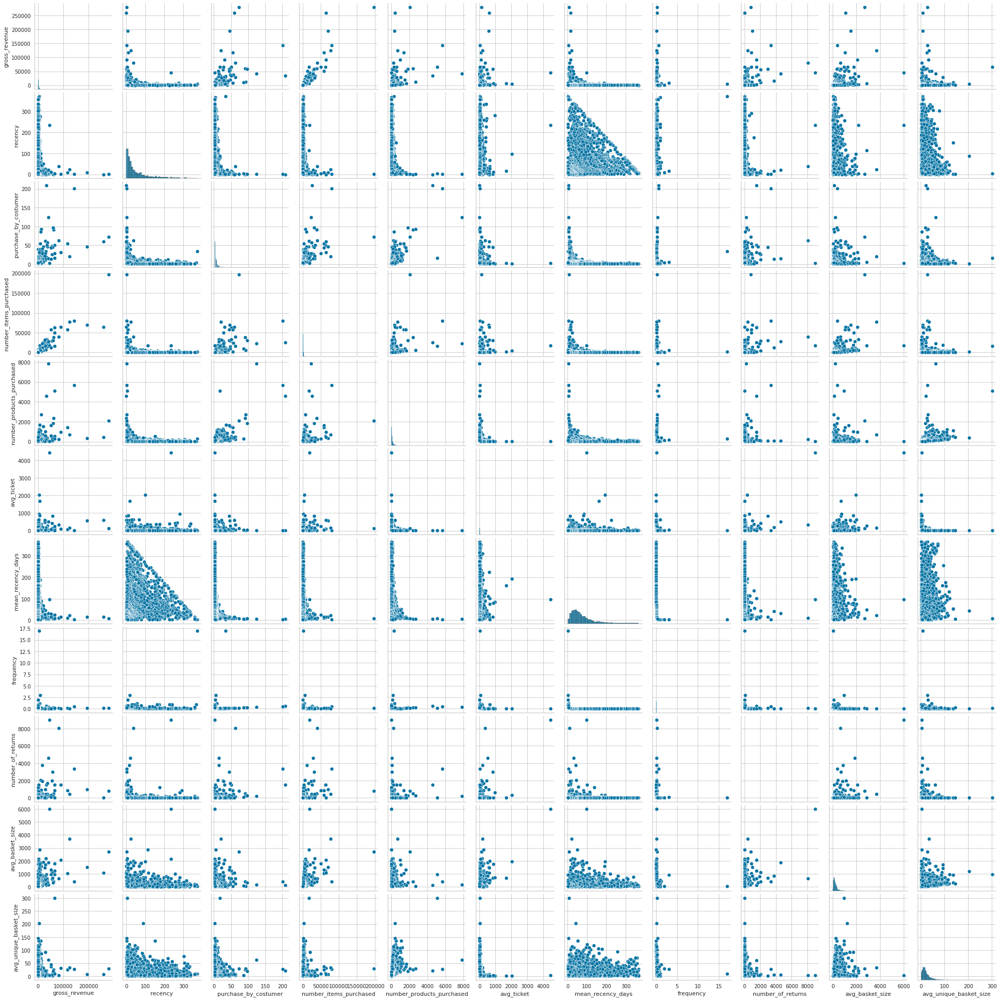

In [44]:
plt.figure(figsize=(25,12))

sns.pairplot(df_4.loc[:, df_4.columns!='customer_id'])

Important notes about some features after pairplot observation:

- 'frequency': the 'frequency' does not contain variation in its axis (it only changes when combined with other features). Probably is going to be removed.
- same goes to 'avg_ticket'.

## <font color="gray">4.3 Data space study</font>

In this section we are going to evaluate if there is some embedding space where it is possible to see some clustering. We are going to evaluate some methods that can provide an embeded/organized space.

### <font color="gray"><i>4.3.0 scaling data</i></font>

In [45]:
# Scaling data =====================

df_4_3 = df_4.set_index('customer_id') # setting costumer id as index (because it is not a feature)


# instantiating the scaler


# 'gross_revenue'

scaler = MinMaxScaler()


df_4_3['gross_revenue'] = scaler.fit_transform(df_4_3[['gross_revenue']])


# 'recency'

scaler = MinMaxScaler()


df_4_3['recency'] = scaler.fit_transform(df_4_3[['recency']])


# 'purchase_by_costumer'

scaler = MinMaxScaler()


df_4_3['purchase_by_costumer'] = scaler.fit_transform(df_4_3[['purchase_by_costumer']])


# 'number_items_purchased'

scaler = MinMaxScaler()


df_4_3['number_items_purchased'] = scaler.fit_transform(df_4_3[['number_items_purchased']])


# 'number_products_purchased'

scaler = MinMaxScaler()


df_4_3['number_products_purchased'] = scaler.fit_transform(df_4_3[['number_products_purchased']])


# 'avg_ticket'

scaler = MinMaxScaler()


df_4_3['avg_ticket'] = scaler.fit_transform(df_4_3[['avg_ticket']])


# 'mean_recency_days'

scaler = MinMaxScaler()


df_4_3['mean_recency_days'] = scaler.fit_transform(df_4_3[['mean_recency_days']])


# 'frequency'

scaler = MinMaxScaler()


df_4_3['frequency'] = scaler.fit_transform(df_4_3[['frequency']])


# 'number_of_returns'

scaler = MinMaxScaler()


df_4_3['number_of_returns'] = scaler.fit_transform(df_4_3[['number_of_returns']])


# 'avg_basket_size'

scaler = MinMaxScaler()


df_4_3['avg_basket_size'] = scaler.fit_transform(df_4_3[['avg_basket_size']])


# 'avg_unique_basket_size'

scaler = MinMaxScaler()


df_4_3['avg_unique_basket_size'] = scaler.fit_transform(df_4_3[['avg_unique_basket_size']])

In [46]:
X = df_4_3.copy()

X

,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
customer_id,,,,,,,,,,,
17850,0.019216,1.000000,0.154589,0.008791,0.037608,0.003595,0.000000,1.000000,0.004438,0.008317,0.025815
13047,0.011530,0.083333,0.038647,0.007054,0.021673,0.003746,0.131115,0.001395,0.003994,0.022985,0.054064
12583,0.025962,0.005376,0.062802,0.025686,0.031234,0.006140,0.069863,0.002052,0.005658,0.055978,0.051616
13748,0.003360,0.255376,0.014493,0.002219,0.003315,0.007125,0.251142,0.000734,0.000000,0.014447,0.015351
15100,0.003102,0.895161,0.004831,0.000396,0.000127,0.065116,0.052055,0.003985,0.002441,0.004272,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
13596,0.002463,0.013441,0.000000,0.002052,0.020908,0.000460,0.016438,0.014390,0.000000,0.033620,0.273655
14893,0.004393,0.024194,0.000000,0.004047,0.009052,0.003326,0.002740,0.038908,0.000000,0.066325,0.118473
14126,0.002495,0.018817,0.004831,0.002570,0.001657,0.010093,0.005479,0.043811,0.005547,0.028017,0.013349


### <font color="gray"><i>4.3.1 PCA</i></font>

In [47]:
pca = PCA(n_components=X.shape[1], random_state=42) # instantiating PCA object


principal_components = pca.fit_transform(X) # fitting-transforming X to get scores

principal_components = pd.DataFrame(principal_components)

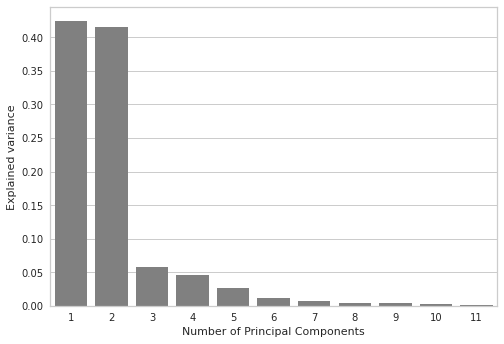

In [48]:
# Plotting explained variance

features = list(range(1,pca.n_components_+1)) # getting the number of components

sns.barplot(features, pca.explained_variance_ratio_, color='grey')

plt.xlabel('Number of Principal Components')

plt.ylabel('Explained variance');

Acording to the barplot above the first two principal componentes are responsible for carrying most of data variance.

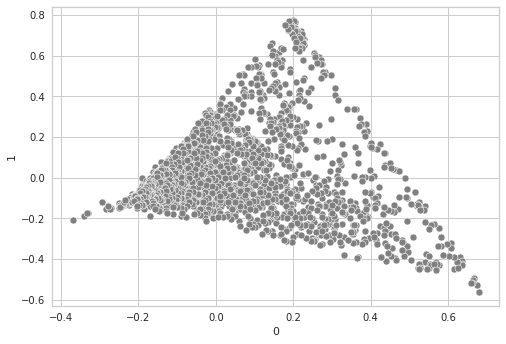

In [49]:
# Ploting score plot


sns.scatterplot(x=principal_components[0], y=principal_components[1], color='grey');

As you can see in the score plot above, samples do not seem to be clustering properly within embedding space formed by PCA. Let's check other methods.

### <font color="gray"><i>4.3.2 UMAP</i></font>

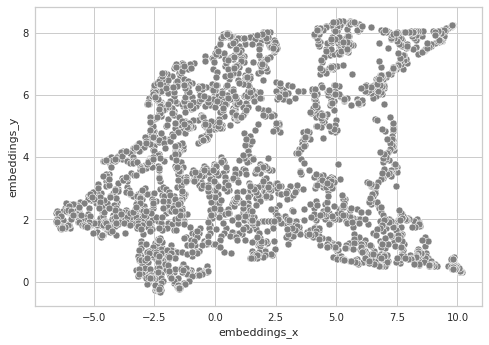

In [50]:
# calling the reducer object
reducer = umap.UMAP(n_neighbors=15, random_state=42)

# getting the embeddings by fitting the reducer
embedding = reducer.fit_transform(X)

# getting axis for plot
principal_components['embeddings_x'] = embedding[:,0]
principal_components['embeddings_y'] = embedding[:,1]

# plotting UMAP
sns.scatterplot(x='embeddings_x',
                y='embeddings_y',
                data=principal_components,
                color='gray');

### <font color="gray"><i>4.3.3 t-SNE</i></font>

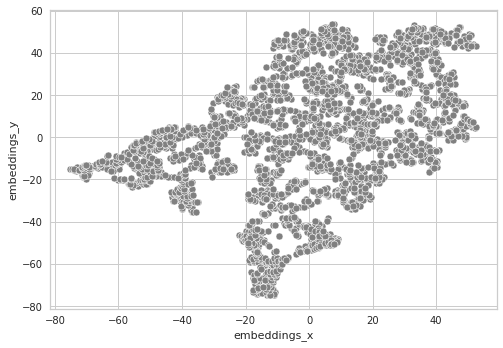

In [51]:
# calling the reducer object
reducer = TSNE(n_components=2, random_state=42, n_jobs=-1)

# getting the embeddings by fitting the reducer
embedding = reducer.fit_transform(X)

# getting axis for plot
principal_components['embeddings_x'] = embedding[:,0]
principal_components['embeddings_y'] = embedding[:,1]

# plotting UMAP
sns.scatterplot(x='embeddings_x',
                y='embeddings_y',
                data=principal_components,
                color='gray');

### <font color="gray"><i>4.3.4 Tree-based embedding</i></font>

Our strategy here is to fit a Random Forest Regressor using the column 'gross_revenue' as target variable/objective function assuming the this feature is important for clustering valuable customers. After fitting the model we expect to get more organized data to use as input to check clustering behaviour.

In [52]:
# defining 'gross_revenue' as target variable

y = df_4['gross_revenue']

X = df_4.drop(columns='gross_revenue')
X = X.set_index('customer_id')

# instantiating the regressor object
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)


# fitting X
rf.fit(X, y)


# getting leaf information
leaf = rf.apply(X)

# df leaf
df_leaf = pd.DataFrame(leaf)

df_leaf

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,2972,2947,3069,2770,3036,2949,2861,2933,2909,2999,2681,2699,2933,2975,2751,2940,2924,2743,2731,2773,2849,3122,2892,2887,2972,2659,2774,2974,2965,2888,2623,2955,2738,2933,3105,3030,2902,2786,2769,2733,2882,2845,2976,2909,2646,2490,2844,2907,3165,2909,2976,2985,2891,2967,3202,3008,2922,3096,2682,2767,2777,2890,2758,2964,2716,3002,3101,3043,2610,2924,2835,3111,2795,2808,3043,2853,3035,2999,2917,2878,2624,3031,2915,2738,3100,2926,3124,3090,2868,3009,2701,2815,2748,2694,2866,2807,2896,3125,2905,3122
1,2985,2913,2680,2730,2664,2919,2802,2718,2894,2656,2608,2815,2905,2748,2646,2838,2565,2659,2848,2695,2696,2900,2614,2675,2863,2613,2725,2631,2632,2882,2600,2921,2860,2876,2725,2698,2864,2770,2753,2875,2866,2825,2727,2849,2615,2488,2661,2872,2752,2862,2724,2605,2651,2882,2683,2277,2895,2732,2573,2690,2718,2654,2872,2938,2705,2716,2632,2969,2586,2563,2816,2738,2698,2663,2721,2844,2946,2697,2837,2848,2598,2630,2892,2648,2852,2718,2665,2414,2837,2669,2706,2797,2738,2652,2855,2679,2848,2729,2592,2844
2,3450,3344,3361,3406,3409,3416,3392,3351,3446,3356,3424,3299,3368,3408,3315,3316,3401,3411,3168,3315,3192,3399,3326,3307,3352,3353,3208,3354,3200,3361,3250,3397,3473,3345,3324,3418,3378,3356,3356,3283,3288,3354,3381,3347,3307,3366,3188,3223,3383,3340,3322,3402,3379,3357,3365,3318,3397,3441,3333,3366,3350,3357,3336,3441,3350,3383,3458,3377,3364,3348,3340,3446,3404,3398,3422,3231,3353,3281,3434,3213,3328,3240,3422,3359,3328,3392,3371,3428,3384,3375,3380,3141,3302,3334,3357,3337,3348,3250,3325,3367
3,1723,1322,1172,1717,1848,1331,1489,1839,1228,1495,1516,1545,1511,2164,1170,1606,1983,1266,1282,1305,1071,1233,1241,1067,1258,1964,1220,1808,1650,1387,1104,1632,1076,1587,1110,1781,1272,1113,1050,1220,1358,1629,1738,1381,773,1730,1003,1292,1581,1072,1109,1730,1317,1922,1828,1049,1465,1539,1420,1250,750,1205,1567,1614,1356,1631,1395,1860,1898,1165,1330,1765,1327,1317,1490,1365,1564,1251,1387,1471,1092,1625,1374,1281,1600,1862,1328,1269,1673,1287,1982,1338,1546,1162,2012,1630,1334,1339,1058,1163
4,553,721,572,554,586,330,379,462,631,455,469,464,470,531,114,478,562,556,682,541,700,444,626,128,639,575,324,592,487,151,555,506,639,449,577,557,450,632,542,511,727,511,472,578,595,511,438,639,476,137,683,545,690,470,482,544,104,722,458,448,142,597,472,567,620,563,572,446,542,159,651,143,661,607,539,572,472,569,471,335,664,588,583,614,442,523,655,578,616,510,544,453,896,718,561,540,705,701,175,593
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2780,1319,895,1279,1220,820,866,1065,1240,790,1049,1252,1075,1101,822,808,1097,1305,1077,866,1140,1122,1006,845,1143,869,1262,876,779,1212,914,1235,1185,1219,1106,920,920,1100,1179,1146,1068,1241,1264,1253,1282,1089,1354,1056,1121,854,1171,1157,769,826,1369,1174,1142,1229,1180,1207,919,1126,1278,1154,1202,809,1039,976,748,1123,1247,840,1216,1161,1225,1103,1146,1100,682,968,1112,946,1368,1067,1123,1084,753,878,1014,1097,991,912,909,1031,998,779,722,1117,811,1145,1261
2781,2085,1679,2013,1877,1710,1820,1755,1625,1768,2064,1955,1776,1874,1743,1698,1834,1566,1762,1754,1831,1755,2034,1907,1658,1919,1782,1931,1491,1866,1636,1587,1929,1831,2030,1791,1653,1876,1641,1723,1828,1714,1831,1988,1695,2077,1639,1757,1893,1805,2041,1775,1936,1724,1666,1959,1669,1736,1798,1907,1840,2023,1575,1902,1979,2034,1944,1984,1467,1681,1698,1588,1869,1822,1774,1816,1788,1886,1794,1975,1888,1834,1804,1801,1617,2

Random Forest just created an organized embedded data space. We are going to apply dimension reduction techniques (since we got here 100 of variables making necessary dimension reduction) to see if there is some clustering behaviour among samples. 

#### <font color="gray"><i>4.3.4.1 Applying UMAP to tree-embedded data</i></font>

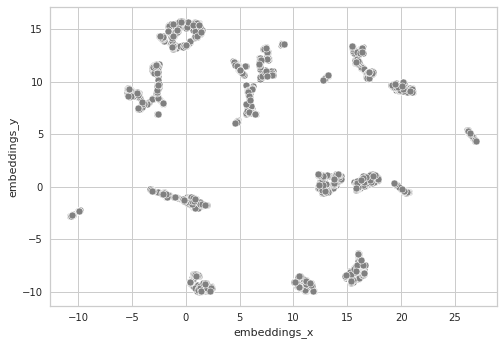

In [53]:
# calling the reducer object
reducer_umap = umap.UMAP(n_neighbors=15, random_state=42)

# getting the embeddings by fitting the reducer
embedding = reducer_umap.fit_transform(df_leaf)

# getting axis for plot
df_tree_umap = pd.DataFrame()
df_tree_umap['embeddings_x'] = embedding[:,0]
df_tree_umap['embeddings_y'] = embedding[:,1]

# plotting UMAP
sns.scatterplot(x='embeddings_x',
                y='embeddings_y',
                data=df_tree_umap,
                color='gray');

Now it is possible to see that there is a clear clustering behaviour among samples.

#### <font color="gray"><i>4.3.4.2 Applying t-SNE to tree-embedded data</i></font>

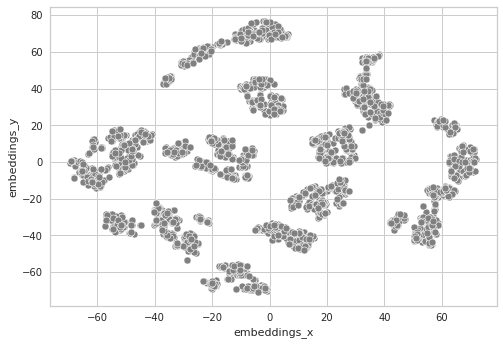

In [54]:
# calling the reducer object
reducer_tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)

# getting the embeddings by fitting the reducer
embedding = reducer_tsne.fit_transform(df_leaf)

# getting axis for plot
df_tree_tsne = pd.DataFrame()
df_tree_tsne['embeddings_x'] = embedding[:,0]
df_tree_tsne['embeddings_y'] = embedding[:,1]

# plotting UMAP
sns.scatterplot(x='embeddings_x',
                y='embeddings_y',
                data=df_tree_tsne,
                color='gray');

# 5 - Data preparation

Tips:

Try following these tips for Data Prep step:

1. For normally distributed data without outliers: StandardScaler()
2. For normally distributed data with outliers: RobustScaler()
3. For non-normally distributed data with/without outliers: MinMaxScaler()

Tests for normallity check:

* Q-Q plot
* Shapiro-Wilk test
* Kolmogorov-Smirnov test

For outlier check:

* Boxplot
* Z-score

For this dataset we are going to apply MinMaxScaler().

In [55]:
df_5 = df_4.copy()

In [56]:
df_5

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,2.000000,17.000000,40.0,50.970588,8.735294
1,13047,3237.54,31.0,10.0,1391.0,172.0,18.822907,49.857143,0.029155,36.0,139.100000,17.200000
2,12583,7281.38,2.0,15.0,5060.0,247.0,29.479271,27.500000,0.040323,51.0,337.333333,16.466667
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,93.666667,0.017921,0.0,87.800000,5.600000
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,21.000000,0.073171,22.0,26.666667,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4290,13596,697.04,5.0,2.0,406.0,166.0,4.199036,8.000000,0.250000,0.0,203.000000,83.000000
4295,14893,1237.85,9.0,2.0,799.0,73.0,16.956849,3.000000,0.666667,0.0,399.500000,36.500000
4314,14126,706.13,7.0,3.0,508.0,15.0,47.075333,4.000000,0.750000,50.0,169.333333,5.000000
4318,13521,1093.65,1.0,3.0,736.0,436.0,2.508372,5.500000,0.300000,0.0,245.333333,145.333333


In [57]:
# Scaling data

# instantiating scaler object
mm_scaler = MinMaxScaler()

# scaling 'gross_revenue'
df_5['gross_revenue'] = mm_scaler.fit_transform(df_5[['gross_revenue']])

# scaling 'recency'
df_5['recency'] = mm_scaler.fit_transform(df_5[['recency']])

# scaling 'purchase_by_costumer'
df_5['purchase_by_costumer'] = mm_scaler.fit_transform(df_5[['purchase_by_costumer']])

# scaling 'number_items_purchased'
df_5['number_items_purchased'] = mm_scaler.fit_transform(df_5[['number_items_purchased']])

# scaling 'number_products_purchased'
df_5['number_products_purchased'] = mm_scaler.fit_transform(df_5[['number_products_purchased']])

# scaling 'avg_ticket'
df_5['avg_ticket'] = mm_scaler.fit_transform(df_5[['avg_ticket']])

# scaling 'mean_recency_days'
df_5['mean_recency_days'] = mm_scaler.fit_transform(df_5[['mean_recency_days']])

# scaling 'frequency'
df_5['frequency'] = mm_scaler.fit_transform(df_5[['frequency']])

# scaling 'number_of_returns'
df_5['number_of_returns'] = mm_scaler.fit_transform(df_5[['number_of_returns']])

# scaling 'avg_basket_size'
df_5['avg_basket_size'] = mm_scaler.fit_transform(df_5[['avg_basket_size']])

# scaling 'avg_unique_basket_size'
df_5['avg_unique_basket_size'] = mm_scaler.fit_transform(df_5[['avg_unique_basket_size']])



In [58]:
df_5

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
0,17850,0.019216,1.000000,0.154589,0.008791,0.037608,0.003595,0.000000,1.000000,0.004438,0.008317,0.025815
1,13047,0.011530,0.083333,0.038647,0.007054,0.021673,0.003746,0.131115,0.001395,0.003994,0.022985,0.054064
2,12583,0.025962,0.005376,0.062802,0.025686,0.031234,0.006140,0.069863,0.002052,0.005658,0.055978,0.051616
3,13748,0.003360,0.255376,0.014493,0.002219,0.003315,0.007125,0.251142,0.000734,0.000000,0.014447,0.015351
4,15100,0.003102,0.895161,0.004831,0.000396,0.000127,0.065116,0.052055,0.003985,0.002441,0.004272,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4290,13596,0.002463,0.013441,0.000000,0.002052,0.020908,0.000460,0.016438,0.014390,0.000000,0.033620,0.273655
4295,14893,0.004393,0.024194,0.000000,0.004047,0.009052,0.003326,0.002740,0.038908,0.000000,0.066325,0.118473
4314,14126,0.002495,0.018817,0.004831,0.002570,0.001657,0.010093,0.005479,0.043811,0.005547,0.028017,0.013349
4318,13521,0.003878,0.002688,0.004831,0.003728,0.055329,0.000080,0.009589,0.017332,0.000000,0.040666,0.481678


# 6 - Feature selection

Since in the final report we are going to describe each clustered group in terms of mean/average values here we are going to remove avg-based features such as 'avg_ticket', 'mean_recency_days', 'avg_basket_size', 'avg_unique_basket_size'. Aditionally, based on pairplot visualization (EDA step) the features 'purchase_by_costumer', 'number_items_purchased' and 'number_products_purchased' show similar behaviour, therefore two of them can be removed reducing data dimensionality without loosing information. We are keeping 'number_products_purchased'.

In [59]:
df_6 = df_5.copy()

In [60]:
df_6

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size
0,17850,0.019216,1.000000,0.154589,0.008791,0.037608,0.003595,0.000000,1.000000,0.004438,0.008317,0.025815
1,13047,0.011530,0.083333,0.038647,0.007054,0.021673,0.003746,0.131115,0.001395,0.003994,0.022985,0.054064
2,12583,0.025962,0.005376,0.062802,0.025686,0.031234,0.006140,0.069863,0.002052,0.005658,0.055978,0.051616
3,13748,0.003360,0.255376,0.014493,0.002219,0.003315,0.007125,0.251142,0.000734,0.000000,0.014447,0.015351
4,15100,0.003102,0.895161,0.004831,0.000396,0.000127,0.065116,0.052055,0.003985,0.002441,0.004272,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
4290,13596,0.002463,0.013441,0.000000,0.002052,0.020908,0.000460,0.016438,0.014390,0.000000,0.033620,0.273655
4295,14893,0.004393,0.024194,0.000000,0.004047,0.009052,0.003326,0.002740,0.038908,0.000000,0.066325,0.118473
4314,14126,0.002495,0.018817,0.004831,0.002570,0.001657,0.010093,0.005479,0.043811,0.005547,0.028017,0.013349
4318,13521,0.003878,0.002688,0.004831,0.003728,0.055329,0.000080,0.009589,0.017332,0.000000,0.040666,0.481678


In [61]:
# Removing 'avg_ticket', 'mean_recency_days', 'avg_basket_size', 'avg_unique_basket_size', 'purchase_by_costumer', 'number_items_purchased'


df_6 = df_6.drop(columns=['avg_ticket',
                          'mean_recency_days',
                          'avg_basket_size',
                          'avg_unique_basket_size',
                          'purchase_by_costumer',
                          'number_items_purchased'])

# 7 - Hyperparameter fine tuning

This session aims to investigate the best k (cluster number) value

In [62]:
df_7 = df_6.copy()

In [63]:
# Removing 'customer_id' column

X = df_7.drop(columns=['customer_id'])

In [64]:
X

,gross_revenue,recency,number_products_purchased,frequency,number_of_returns
0,0.019216,1.000000,0.037608,1.000000,0.004438
1,0.011530,0.083333,0.021673,0.001395,0.003994
2,0.025962,0.005376,0.031234,0.002052,0.005658
3,0.003360,0.255376,0.003315,0.000734,0.000000
4,0.003102,0.895161,0.000127,0.003985,0.002441
...,...,...,...,...,...
4290,0.002463,0.013441,0.020908,0.014390,0.000000
4295,0.004393,0.024194,0.009052,0.038908,0.000000
4314,0.002495,0.018817,0.001657,0.043811,0.005547
4318,0.003878,0.002688,0.055329,0.017332,0.000000


In [65]:
# Defining clusters to test

clusters = list(range(2,10)) # You can only do kmeans with at least 2 clusters

clusters

[2, 3, 4, 5, 6, 7, 8, 9]

## <font color="gray">7.1 KMeans </font>

In [66]:

kmeans_ss_list = []

for i in clusters:

    # model instance
    kmeans = KMeans(n_clusters=i)


    # fitting model
    kmeans.fit(X)

    # predicting
    labels = kmeans.predict(X)

    # silhouette score
    kmeans_ss = silhouette_score(X, labels)
    
    # adding ss score to the list
    kmeans_ss_list.append(kmeans_ss)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


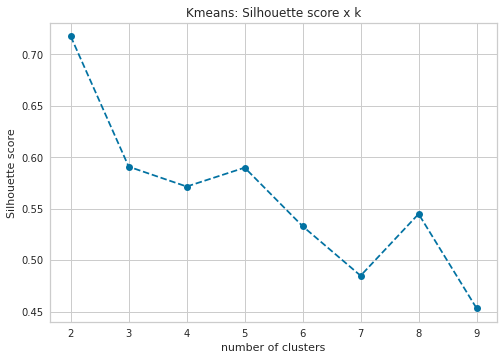

In [67]:
# Plotting silhouette score X k

plt.plot(clusters, kmeans_ss_list, linestyle='--', marker='o')
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.title('Kmeans: Silhouette score x k');

### <font color="gray">7.1 Kmeans with tree-based embeddings </font>

In [68]:
cluster = np.arange(2,36,1)

kmeans_ss_embedded_list = []

for i in cluster:

    # model instance
    kmeans_embedded = KMeans(n_clusters=i)


    # fitting model
    kmeans_embedded.fit(df_tree_umap)

    # predicting
    labels = kmeans_embedded.predict(df_tree_umap)

    # silhouette score
    kmeans_ss_embedded = silhouette_score(df_tree_umap, labels)
    
    # adding ss score to the list
    kmeans_ss_embedded_list.append(kmeans_ss_embedded)

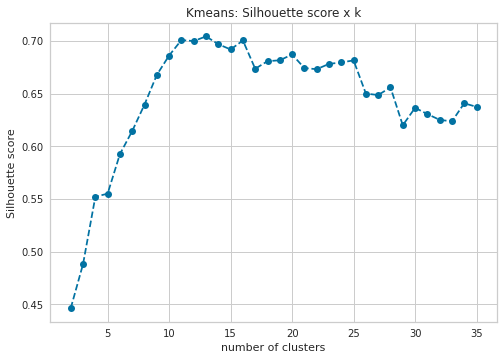

In [69]:
# Plotting silhouette score X k

plt.plot(cluster, kmeans_ss_embedded_list, linestyle='--', marker='o')
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.title('Kmeans: Silhouette score x k');

## <font color="gray">7.2 Gaussian Mixture Model - GMM </font>

In [70]:

gmm_ss_list = []

for i in clusters:

    # model instance
    gmm = GaussianMixture(n_components=i)


    # fitting model
    gmm.fit(X)

    # predicting
    labels = gmm.predict(X)

    # silhouette score
    gmm_ss = silhouette_score(X, labels)
    
    # adding ss score to the list
    gmm_ss_list.append(gmm_ss)

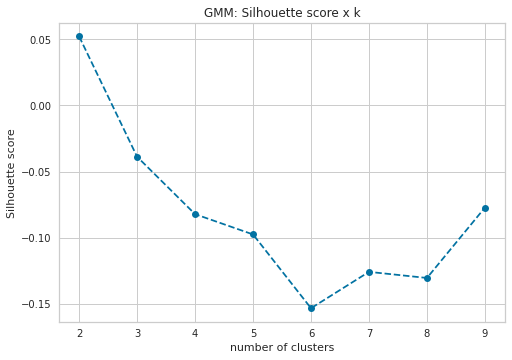

In [71]:
# Plotting silhouette score X k

plt.plot(clusters, gmm_ss_list, linestyle='--', marker='o')
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.title('GMM: Silhouette score x k');

### <font color="gray">7.2 Gaussian Mixture Model - GMM with tree-based embeddings</font>

In [72]:
cluster = np.arange(2,36,1)
gmm_ss_embedded_list = []

for i in cluster:

    # model instance
    gmm_embedded = GaussianMixture(n_components=i)


    # fitting model
    gmm_embedded.fit(df_tree_umap)

    # predicting
    labels = gmm_embedded.predict(df_tree_umap)

    # silhouette score
    gmm_embedded_ss = silhouette_score(df_tree_umap, labels)
    
    # adding ss score to the list
    gmm_ss_embedded_list.append(gmm_embedded_ss)

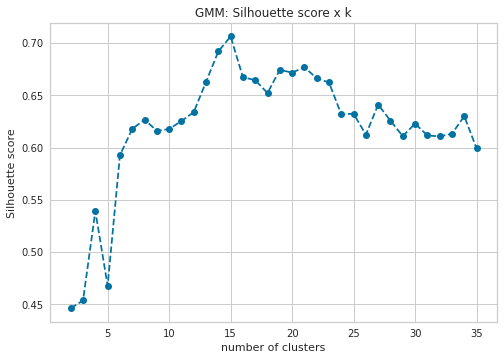

In [73]:
# Plotting silhouette score X k

plt.plot(cluster, gmm_ss_embedded_list, linestyle='--', marker='o')
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.title('GMM: Silhouette score x k');

## <font color="gray">7.3 Hierarchical clustering</font>

In [74]:
# instatiating and fitting model
hc = hierarchy.linkage(X, method='ward', metric='euclidean')

[]

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


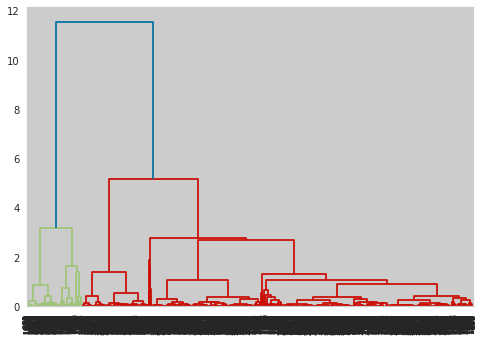

In [75]:
# plotting dendrogram

hierarchy.dendrogram(hc,
                     leaf_rotation=90,
                     leaf_font_size=8)

plt.plot()

[]

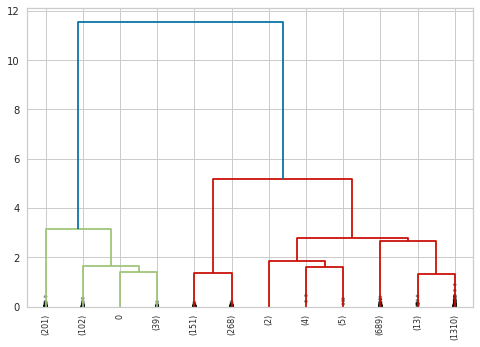

In [76]:
hierarchy.dendrogram(hc,
                     leaf_rotation=90,
                     leaf_font_size=8, truncate_mode='lastp', p=12, show_contracted=True)

plt.plot()

In [77]:
# Silhouette score

hc_ss_list = []

for i in clusters:

    # model instance & fit
    hc = hierarchy.linkage(X, method='ward', metric='euclidean')

    # model prediction
    labels = hierarchy.fcluster(hc, i, criterion='maxclust')

    # silhouette score
    hc_ss = silhouette_score(X, labels)
    
    #adding ss score to the list
    hc_ss_list.append(hc_ss)



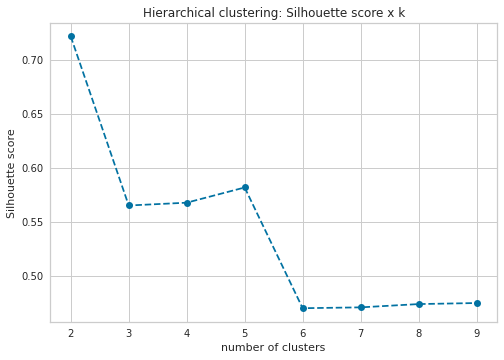

In [78]:
# Plotting silhouette score X k

plt.plot(clusters, hc_ss_list, linestyle='--', marker='o')
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.title('Hierarchical clustering: Silhouette score x k');

### <font color="gray">7.3 Hierarchical clustering with tree-based embeddings</font>

In [79]:
# instatiating and fitting model
hc_embedded = hierarchy.linkage(df_tree_umap, method='ward', metric='euclidean')

[]

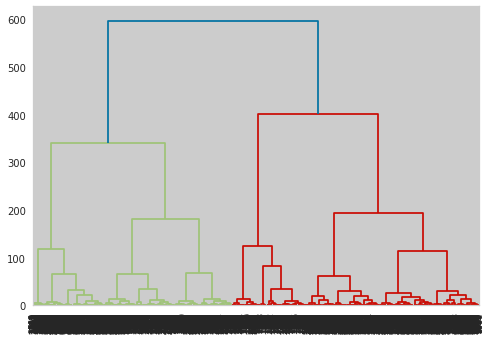

In [80]:
# plotting dendrogram

hierarchy.dendrogram(hc_embedded,
                     leaf_rotation=90,
                     leaf_font_size=8)

plt.plot()

[]

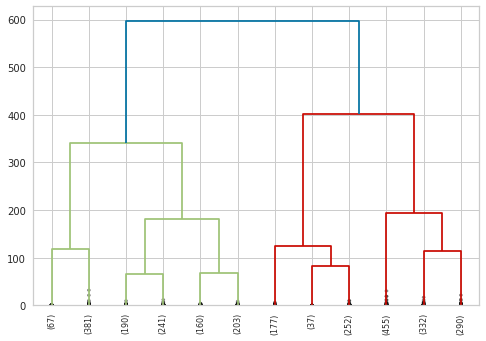

In [81]:
hierarchy.dendrogram(hc_embedded,
                     leaf_rotation=90,
                     leaf_font_size=8, truncate_mode='lastp', p=12, show_contracted=True)

plt.plot()

In [82]:
# Silhouette score

hc_ss_embedded_list = []

for i in cluster:

    # model instance & fit
    hc_embedded = hierarchy.linkage(df_tree_umap, method='ward', metric='euclidean')

    # model prediction
    labels = hierarchy.fcluster(hc_embedded, i, criterion='maxclust')

    # silhouette score
    hc_ss_embedded = silhouette_score(df_tree_umap, labels)
    
    #adding ss score to the list
    hc_ss_embedded_list.append(hc_ss_embedded)



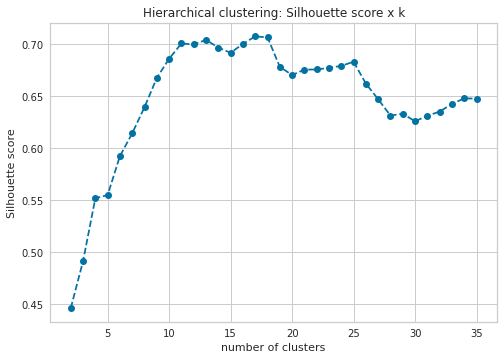

In [83]:
# Plotting silhouette score X k

plt.plot(cluster, hc_ss_embedded_list, linestyle='--', marker='o')
plt.xlabel('number of clusters')
plt.ylabel('Silhouette score')
plt.title('Hierarchical clustering: Silhouette score x k');

## <font color="gray">7.4 DBSCAN </font>

In [84]:

# model instance
dbscan = DBSCAN(eps=0.01, min_samples=20, n_jobs=-1)

# fitting model
labels = dbscan.fit_predict(X)

# silhouette score
dbscan_ss = silhouette_score(X, labels)

In [85]:
print('Silhouette score: {}'.format(dbscan_ss))
print('Number of clusters: {}'.format(len(np.unique(labels[labels>-1]))))
print('Labels: {}'.format(np.unique(labels[labels>-1])))

Silhouette score: 0.2400971546152692
Number of clusters: 5
Labels: [0 1 2 3 4]


### <font color="gray">7.3 DBSCAN with tree-based embeddings</font>

In [86]:

# model instance
dbscan_embedded = DBSCAN(min_samples=20, n_jobs=-1)

# fitting model
labels = dbscan_embedded.fit_predict(df_tree_umap)

# silhouette score
dbscan_embedded_ss = silhouette_score(df_tree_umap, labels)

In [87]:
print('Silhouette score: {}'.format(dbscan_embedded_ss))
print('Number of clusters: {}'.format(len(np.unique(labels[labels>-1]))))
print('Labels: {}'.format(np.unique(labels[labels>-1])))

Silhouette score: 0.6409059166908264
Number of clusters: 30
Labels: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]


## <font color="gray">Summary of results </font>

In [88]:
# Results - feature space

df_results = pd.DataFrame(index=['KMeans', 'GMM', 'HC'],
                          columns=clusters,
                          data=[kmeans_ss_list, gmm_ss_list, hc_ss_list])

df_results.style.highlight_max(axis=1)

,2,3,4,5,6,7,8,9
KMeans,0.717285,0.590751,0.571453,0.589801,0.532912,0.484844,0.544818,0.453274
GMM,0.052120,-0.038745,-0.082103,-0.097433,-0.153139,-0.125687,-0.130302,-0.077144
HC,0.721760,0.565255,0.567852,0.581929,0.470181,0.470967,0.474009,0.474977


In [89]:
# Results - embedding space

df_results = pd.DataFrame(index=['KMeans', 'GMM', 'HC'],
                          columns=cluster,
                          data=[kmeans_ss_embedded_list, gmm_ss_embedded_list, hc_ss_embedded_list])

df_results.style.highlight_max(axis=1)

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
KMeans,0.446303,0.488138,0.552095,0.555067,0.592665,0.614542,0.639673,0.667824,0.686208,0.700890,0.699944,0.704357,0.696969,0.691952,0.700493,0.673635,0.680849,0.681678,0.687188,0.674299,0.673229,0.678261,0.679646,0.681586,0.650078,0.648683,0.655993,0.619981,0.636534,0.630634,0.625128,0.623703,0.640862,0.637476
GMM,0.446303,0.453720,0.539222,0.467810,0.592665,0.617795,0.626753,0.616028,0.617669,0.625355,0.633807,0.662743,0.691908,0.706314,0.667341,0.664444,0.652168,0.674367,0.671618,0.676866,0.666243,0.662245,0.631764,0.632302,0.612417,0.641106,0.625614,0.610902,0.622885,0.611582,0.610626,0.613217,0.630041,0.599169
HC,0.446303,0.491499,0.552095,0.555067,0.592665,0.614542,0.639673,0.667824,0.686208,0.700890,0.699944,0.704357,0.696969,0.691952,0.700493,0.707707,0.706828,0.678465,0.670578,0.675738,0.675899,0.677422,0.679401,0.683324,0.662331,0.647259,0.631570,0.633339,0.626068,0.631390,0.635412,0.642805,0.648117,0.647858


## <font color="gray">7.X Silhouette analysis </font>

 For k = 2. Silhouette Score: 0.7217604060843672
 For k = 3. Silhouette Score: 0.5652546415975047
 For k = 4. Silhouette Score: 0.5678515300576246
 For k = 5. Silhouette Score: 0.5819285456259403
 For k = 6. Silhouette Score: 0.47018146058416055
 For k = 7. Silhouette Score: 0.4709669533633671
 For k = 8. Silhouette Score: 0.4740085811182077
 For k = 9. Silhouette Score: 0.4749768316670944


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


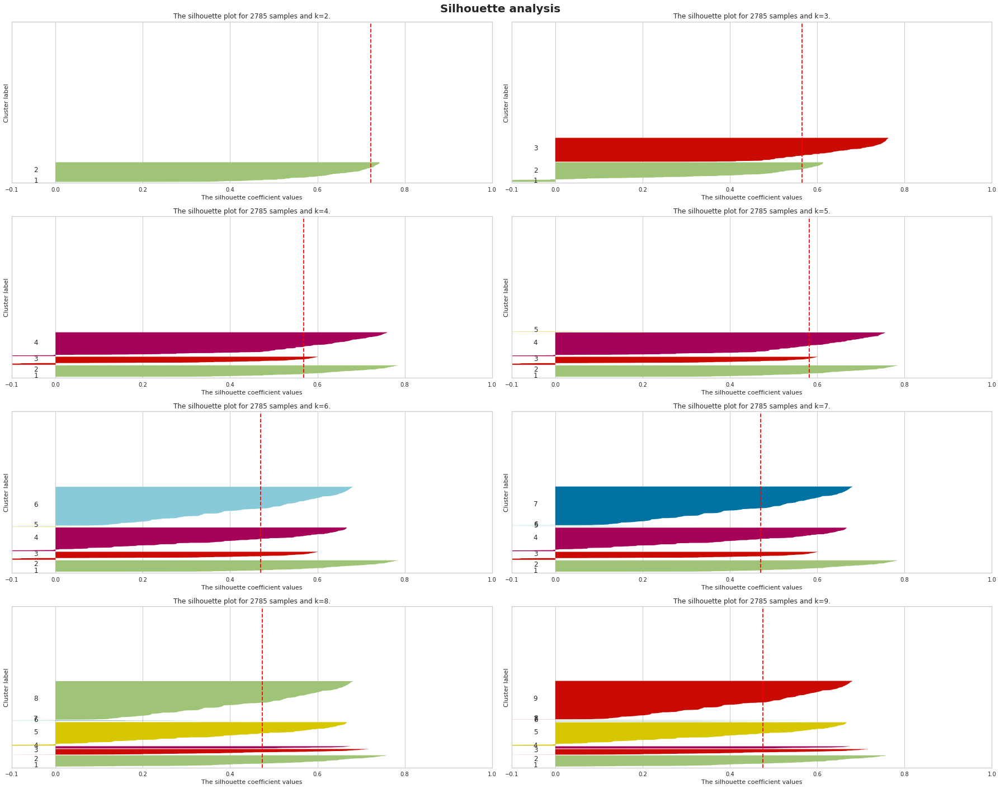

In [90]:
# Silhouette analysis - Hierarquical clustering

fig, ax = plt.subplots( int(len(clusters)/2), int(int(len(clusters))/(int(len(clusters)/2))) )
fig.set_size_inches( 25, 20 )

for k in clusters:
    q, mod = divmod( k, min(clusters) ) # getting values to set ax positions to plot multipanel figure
    
    ax[q-1, mod].set_xlim( [ -0.1, 1] )
    ax[q-1, mod].set_ylim( [ 0, len( X ) + ( k+1 )*10] )
    
    # model definition & training
    hc_model = hierarchy.linkage( X, 'ward' )

    # model predict
    labels = hierarchy.fcluster( hc_model, k, criterion='maxclust' )

    # performance
    ss = silhouette_score( X, labels, metric='euclidean' )
    print( ' For k = {}. Silhouette Score: {}'.format( k, ss ) )

    samples_silhouette_values = silhouette_samples( X, labels )

    y_lower = 10
    
    for i in range( k ):

        # select clusters
        ith_samples_silhouette_values = samples_silhouette_values[ labels == i]
        
        # sort values
        ith_samples_silhouette_values.sort()

        # size clusters
        size_cluster_i = ith_samples_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        cmap = plt.get_cmap( 'Spectral' )
        color = cmap( i / k )

        ax[q-1, mod].fill_betweenx( np.arange( y_lower, y_upper ), 0, ith_samples_silhouette_values  )
        
        
        # Label the silhouette plots with their cluster numbers at the middle
        ax[q-1, mod].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i+1)) # added i+1 to remove cluster label == 0
        
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10 # 10 for the 0 samples
                

        
    ax[q-1, mod].set_yticks([]) # Clear the yaxis labels / ticks
    ax[q-1, mod].set_xticks( [-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    
    # adding title to each plot
    ax[q-1, mod].set_title("The silhouette plot for {} samples and k={}.".format(X.shape[0], k))
    
    # x label - title
    ax[q-1, mod].set_xlabel("The silhouette coefficient values")
    
    # y label - title
    ax[q-1, mod].set_ylabel("Cluster label")
    
    
    # The vertical line for average silhouette score of all the values
    ax[q-1, mod].axvline(x=ss, color="red", linestyle="--")


    
plt.suptitle('Silhouette analysis', fontsize=20, fontweight="bold")    
fig.tight_layout();

 For k = 2. Silhouette Score: 0.7217604060843672
 For k = 3. Silhouette Score: 0.5652546415975047
 For k = 4. Silhouette Score: 0.5678515300576246
 For k = 5. Silhouette Score: 0.5819285456259403
 For k = 6. Silhouette Score: 0.47018146058416055
 For k = 7. Silhouette Score: 0.4709669533633671
 For k = 8. Silhouette Score: 0.4740085811182077
 For k = 9. Silhouette Score: 0.4749768316670944


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif


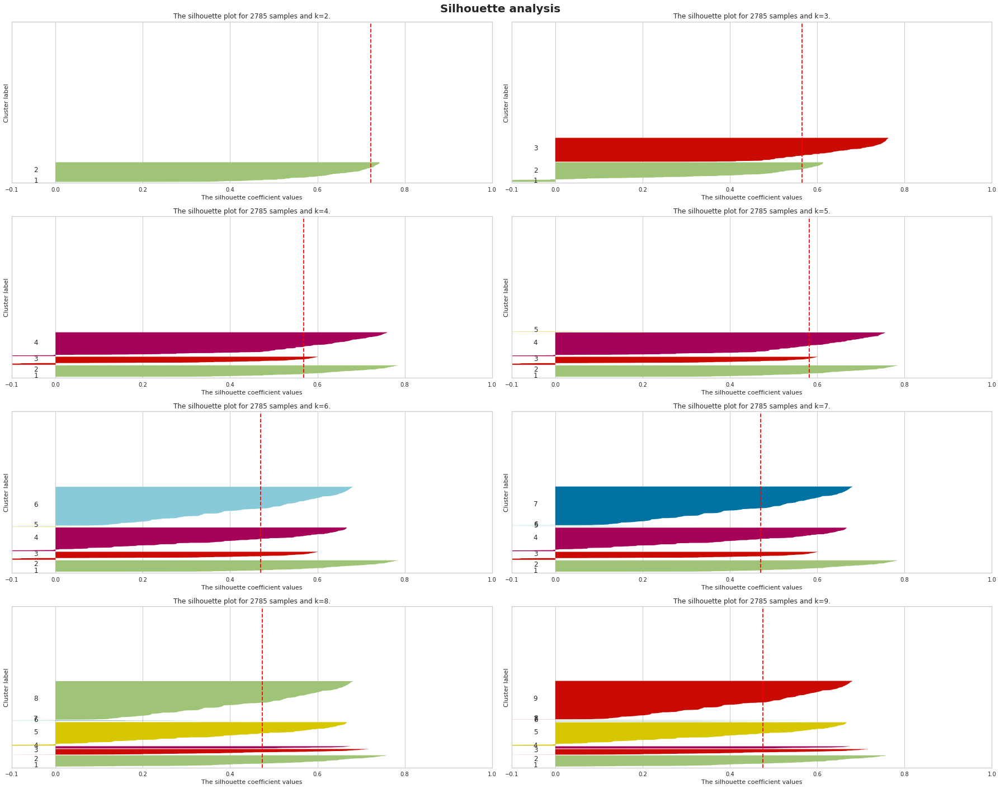

In [90]:
# Silhouette analysis - Hierarquical clustering

fig, ax = plt.subplots( int(len(clusters)/2), int(int(len(clusters))/(int(len(clusters)/2))) )
fig.set_size_inches( 25, 20 )

for k in clusters:
    q, mod = divmod( k, min(clusters) ) # getting values to set ax positions to plot multipanel figure
    
    ax[q-1, mod].set_xlim( [ -0.1, 1] )
    ax[q-1, mod].set_ylim( [ 0, len( X ) + ( k+1 )*10] )
    
    # model definition & training
    hc_model = hierarchy.linkage( X, 'ward' )

    # model predict
    labels = hierarchy.fcluster( hc_model, k, criterion='maxclust' )

    # performance
    ss = silhouette_score( X, labels, metric='euclidean' )
    print( ' For k = {}. Silhouette Score: {}'.format( k, ss ) )

    samples_silhouette_values = silhouette_samples( X, labels )

    y_lower = 10
    
    for i in range( k ):

        # select clusters
        ith_samples_silhouette_values = samples_silhouette_values[ labels == i]
        
        # sort values
        ith_samples_silhouette_values.sort()

        # size clusters
        size_cluster_i = ith_samples_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        cmap = plt.get_cmap( 'Spectral' )
        color = cmap( i / k )

        ax[q-1, mod].fill_betweenx( np.arange( y_lower, y_upper ), 0, ith_samples_silhouette_values  )
        
        
        # Label the silhouette plots with their cluster numbers at the middle
        ax[q-1, mod].text(-0.05, y_lower + 0.5 * size_cluster_i, str(i+1)) # added i+1 to remove cluster label == 0
        
        # Compute the new y_lower for next plot
        y_lower = y_upper + 10 # 10 for the 0 samples
                

        
    ax[q-1, mod].set_yticks([]) # Clear the yaxis labels / ticks
    ax[q-1, mod].set_xticks( [-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    
    # adding title to each plot
    ax[q-1, mod].set_title("The silhouette plot for {} samples and k={}.".format(X.shape[0], k))
    
    # x label - title
    ax[q-1, mod].set_xlabel("The silhouette coefficient values")
    
    # y label - title
    ax[q-1, mod].set_ylabel("Cluster label")
    
    
    # The vertical line for average silhouette score of all the values
    ax[q-1, mod].axvline(x=ss, color="red", linestyle="--")


    
plt.suptitle('Silhouette analysis', fontsize=20, fontweight="bold")    
fig.tight_layout();

# 8 - Model training

## <font color="gray">8.1 K-Means </font>

We are going to fit the model using k=3 (decision made based on analysis above - WSS and SS)

In [181]:
df_8 = df_7.set_index('customer_id')

In [182]:
# Model

k = 3


# instantiating the model

model = KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42)


# fitting the model

model.fit(df_8)


# predicting labels/clusters

labels = model.labels_


### <font color="gray">8.1 K-Means with tree-based embeddings</font>

For embedded model we are going to fit the model using k=11 (decision made based on analysis above - WSS and SS)

In [183]:
# Model

k = 11


# instantiating the model

model_embedded = KMeans(init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42)


# fitting the model

model_embedded.fit(df_tree_umap)


# predicting labels/clusters

labels_embedded = model_embedded.labels_


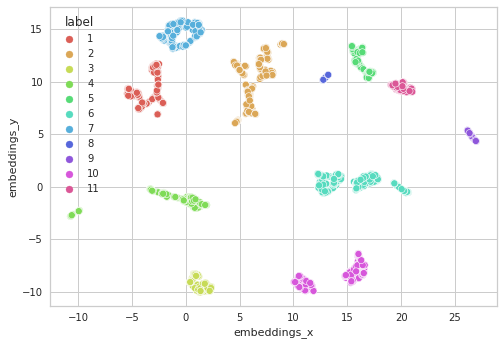

In [184]:
df_tree_umap_labels = df_tree_umap.copy()
df_tree_umap_labels['label'] = labels_embedded+1

sns.scatterplot(x='embeddings_x', 
                y='embeddings_y', 
                data=df_tree_umap_labels, 
                hue='label', 
                palette=sns.color_palette('hls', n_colors=len(df_tree_umap_labels['label'].unique())));

## <font color="gray">8.2 Cluster validation </font>

In [185]:

# WSS
print('WSS: {}'.format(model.inertia_))

# SS
print('Silhouette score: {}'.format(round(silhouette_score(df_8, labels, metric='euclidean', random_state=42),2)))



WSS: 23.5524056079887
Silhouette score: 0.59


In [186]:
# Embedded model

# WSS
print('WSS: {}'.format(model_embedded.inertia_))

# SS
print('Silhouette score: {}'.format(round(silhouette_score(df_tree_umap, labels_embedded, metric='euclidean', random_state=42),2)))



WSS: 14574.40625
Silhouette score: 0.6600000262260437


# 9 - Cluster analysis

In [187]:
df_9 = df_8.copy()

In [188]:
# Adding 'cluster/label' column to df_4 (df_4 without data transforming. For cluster profile report)

df_4['label'] = labels+1


df_4.head()

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size,label
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,2.000000,17.000000,40.0,50.970588,8.735294,1
1,13047,3237.54,31.0,10.0,1391.0,172.0,18.822907,49.857143,0.029155,36.0,139.100000,17.200000,3
2,12583,7281.38,2.0,15.0,5060.0,247.0,29.479271,27.500000,0.040323,51.0,337.333333,16.466667,3
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,93.666667,0.017921,0.0,87.800000,5.600000,2
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,21.000000,0.073171,22.0,26.666667,1.000000,1


In [189]:
# Adding embedded 'cluster/label' column to df_4_2 (df_4 without data transforming. For cluster profile report)

df_4_2 = df_4.copy()
df_4_2['label'] = labels_embedded+1


df_4_2.head()

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size,label
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,2.000000,17.000000,40.0,50.970588,8.735294,10
1,13047,3237.54,31.0,10.0,1391.0,172.0,18.822907,49.857143,0.029155,36.0,139.100000,17.200000,10
2,12583,7281.38,2.0,15.0,5060.0,247.0,29.479271,27.500000,0.040323,51.0,337.333333,16.466667,4
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,93.666667,0.017921,0.0,87.800000,5.600000,1
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,21.000000,0.073171,22.0,26.666667,1.000000,2


In [190]:
# Adding 'cluster/label' column

df_9['label'] = labels+1


df_9.head()

,gross_revenue,recency,number_products_purchased,frequency,number_of_returns,label
customer_id,,,,,,
17850,0.019216,1.000000,0.037608,1.000000,0.004438,1
13047,0.011530,0.083333,0.021673,0.001395,0.003994,3
12583,0.025962,0.005376,0.031234,0.002052,0.005658,3
13748,0.003360,0.255376,0.003315,0.000734,0.000000,2
15100,0.003102,0.895161,0.000127,0.003985,0.002441,1


## <font color="gray">9.1 Silhouette Visual inspection </font>

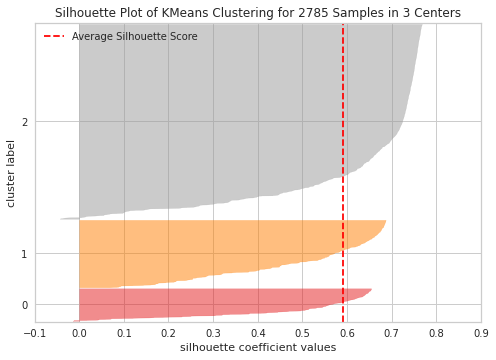

In [191]:
visualizer = SilhouetteVisualizer(model, color='yellowbrick')

visualizer.fit(df_8)

visualizer.finalize()



### <font color="gray">9.1 Silhouette Visual inspection - embedded space</font>

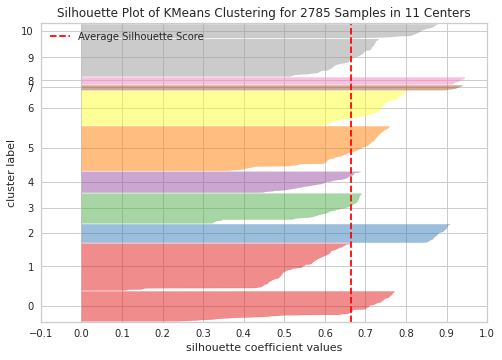

In [192]:
visualizer = SilhouetteVisualizer(model_embedded, color='yellowbrick')

visualizer.fit(df_tree_umap)

visualizer.finalize()



## <font color="gray">9.2 2D Pairplots </font>

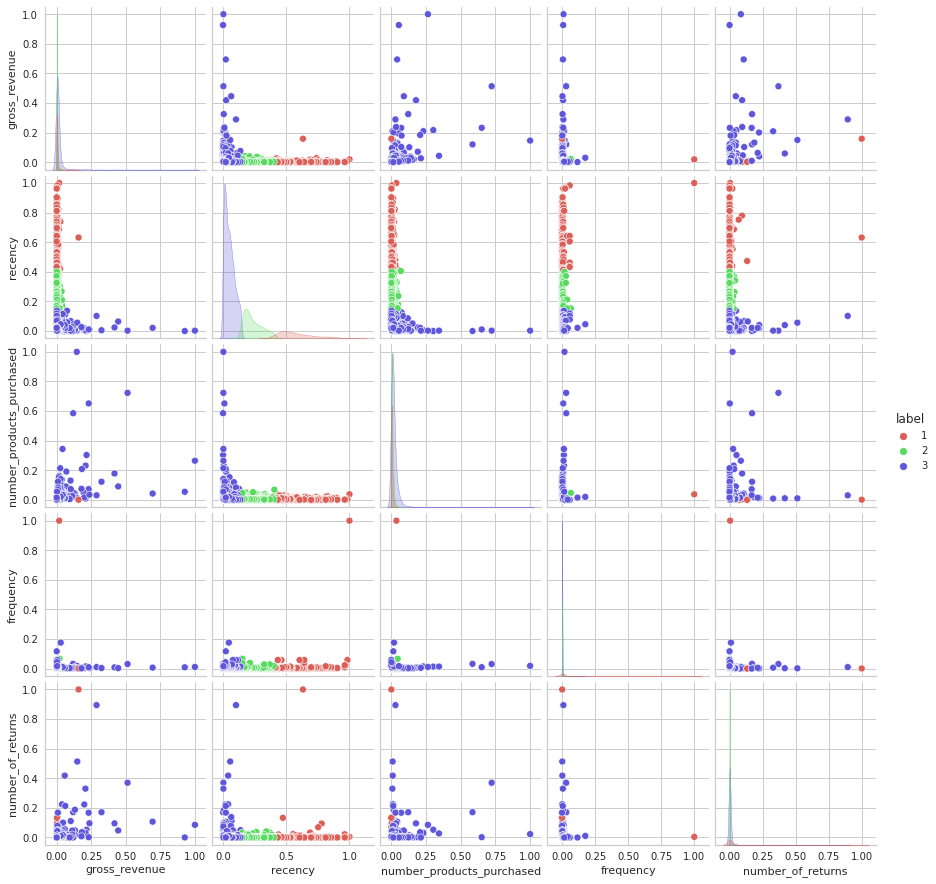

In [100]:
# Plotting pairplots

sns.pairplot(df_9, 
             hue='label',
             palette=sns.color_palette('hls', n_colors=len(df_9['label'].unique())));

### <font color="gray">9.2 2D Pairplots - embedded</font>

<Figure size 1440x1080 with 0 Axes>

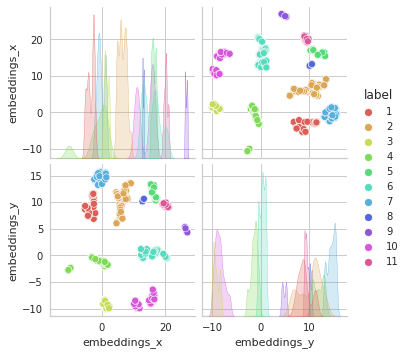

In [101]:
# Plotting pairplots

plt.figure(figsize=(20,15))

sns.pairplot(df_tree_umap_labels, 
             hue='label',
             palette=sns.color_palette('hls', n_colors=len(df_tree_umap_labels['label'].unique())));

## <font color="gray">9.3 UMAP </font>

UMAP works better(faster) for high amount of data.

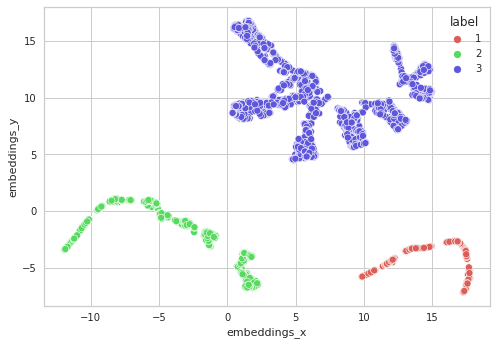

In [102]:
df_viz = df_9.copy()


# calling the reducer object
reducer = umap.UMAP(n_neighbors=15, random_state=42)

# getting the embeddings by fitting the reducer
embedding = reducer.fit_transform(df_9)

# getting axis for plot
df_viz['embeddings_x'] = embedding[:,0]
df_viz['embeddings_y'] = embedding[:,1]

# plotting UMAP
sns.scatterplot(x='embeddings_x',
                y='embeddings_y',
                hue='label',
                data=df_viz,
                palette=sns.color_palette('hls', n_colors=len(df_viz['label'].unique())) );

## <font color="gray">9.4 Cluster profile </font>

This step aims to understand the profile of people located in each cluster, who they are, their profile, description, etc

In [193]:
df_4

,customer_id,gross_revenue,recency,purchase_by_costumer,number_items_purchased,number_products_purchased,avg_ticket,mean_recency_days,frequency,number_of_returns,avg_basket_size,avg_unique_basket_size,label
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,2.000000,17.000000,40.0,50.970588,8.735294,1
1,13047,3237.54,31.0,10.0,1391.0,172.0,18.822907,49.857143,0.029155,36.0,139.100000,17.200000,3
2,12583,7281.38,2.0,15.0,5060.0,247.0,29.479271,27.500000,0.040323,51.0,337.333333,16.466667,3
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,93.666667,0.017921,0.0,87.800000,5.600000,2
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,21.000000,0.073171,22.0,26.666667,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4290,13596,697.04,5.0,2.0,406.0,166.0,4.199036,8.000000,0.250000,0.0,203.000000,83.000000,3
4295,14893,1237.85,9.0,2.0,799.0,73.0,16.956849,3.000000,0.666667,0.0,399.500000,36.500000,3
4314,14126,706.13,7.0,3.0,508.0,15.0,47.075333,4.000000,0.750000,50.0,169.333333,5.000000,3
4318,13521,1093.65,1.0,3.0,736.0,436.0,2.508372,5.500000,0.300000,0.0,245.333333,145.333333,3


In [194]:
# Number of customer in each cluster

print('Percentage of customers in each cluster:')
print(df_4['label'].value_counts(normalize=True))
print('\n')
print('Absolute amount of customers in each cluster:')
print(df_4['label'].value_counts(normalize=False))


# Number of customers in each label/cluster
df_number_of_customers = pd.DataFrame(df_4['label'].value_counts(normalize=False))
df_number_of_customers = df_number_of_customers.reset_index()
df_number_of_customers.columns = ['label','number_of_customers']
df_number_of_customers['percentage'] = df_number_of_customers['number_of_customers'] / df_number_of_customers['number_of_customers'].sum()


# Average gross-revenue (how much the customers of each cluster is spending)
df_gross_revenue = df_4[['label', 'gross_revenue']].groupby('label').mean().reset_index()
df_gross_revenue['percentage'] = df_gross_revenue['gross_revenue'] / df_gross_revenue['gross_revenue'].sum()
df_gross_revenue.columns = ['label', 'mean_gross_revenue', 'gross_revenue_percentage']
df_gross_revenue

# Average recency
df_recency = df_4[['label', 'recency']].groupby('label').mean().reset_index()
df_recency.columns = ['label', 'mean_recency']

# Average frequency
df_frequency = df_4[['label', 'frequency']].groupby('label').mean().reset_index()
df_frequency.columns = ['label', 'mean_frequency']

# Average number of purchases by customer
df_avg_ticket = df_4[['label', 'purchase_by_costumer']].groupby('label').mean().reset_index()
df_avg_ticket.columns = ['label', 'mean_purchase_by_costumer']

# Average returns
df_avg_number_of_returns = df_4[['label', 'number_of_returns']].groupby('label').mean().reset_index()
df_avg_number_of_returns.columns = ['label', 'mean_number_of_returns']



# Cluster report profile (Joining)
df_merged_1 = pd.merge(df_number_of_customers, df_gross_revenue, how='inner', on='label')

df_merged_2 = pd.merge(df_merged_1, df_recency, how='inner', on='label')

df_merged_3 = pd.merge(df_merged_2, df_frequency, how='inner', on='label')

df_merged_4 = pd.merge(df_merged_3, df_avg_number_of_returns, how='inner', on='label')

df_cluster_report = pd.merge(df_merged_4, df_avg_ticket, how='inner', on='label')

print('\nCluster table info:')
df_cluster_report

Percentage of customers in each cluster:
3    0.661041
2    0.228725
1    0.110233
Name: label, dtype: float64


Absolute amount of customers in each cluster:
3    1841
2     637
1     307
Name: label, dtype: int64

Cluster table info:


,label,number_of_customers,percentage,mean_gross_revenue,gross_revenue_percentage,mean_recency,mean_frequency,mean_number_of_returns,mean_purchase_by_costumer
0,3,1841,0.661041,3732.011678,0.614286,18.744161,0.044390,43.045627,7.453015
1,2,637,0.228725,1346.805071,0.221683,88.698587,0.032811,10.141287,3.604396
2,1,307,0.110233,996.549055,0.164031,217.947883,0.124521,47.231270,2.908795


In [195]:
# Report

print('Report:\n')

for i in df_cluster_report.sort_values(by='mean_gross_revenue', ascending=False).index: # labels sorted by revenue
    

    print('Cluster {}:'.format(df_cluster_report.loc[i,'label']))
    print('Number of customers: {} ({}%)'.format(df_cluster_report.loc[i,'number_of_customers'],
                                                (round(df_cluster_report.loc[i,'percentage'],2)*100)))
    print('Mean recency: {} days'.format(round(df_cluster_report.loc[i,'mean_recency'])))
    print('Mean gross revenue: {} dollars'.format(round(df_cluster_report.loc[i,'mean_gross_revenue'], 2)))
    print('% of total revenue: {}'.format(round(df_cluster_report.loc[i,'gross_revenue_percentage']*100),2))
    print('Mean purchase by customer: {}'.format(round(df_cluster_report.loc[i,'mean_purchase_by_costumer']),2))
    print('Mean number of returns: {}'.format(round(df_cluster_report.loc[i,'mean_number_of_returns']),2))
    print('\n')



Report:

Cluster 3:
Number of customers: 1841 (66.0%)
Mean recency: 19 days
Mean gross revenue: 3732.01 dollars
% of total revenue: 61
Mean purchase by customer: 7
Mean number of returns: 43


Cluster 2:
Number of customers: 637 (23.0%)
Mean recency: 89 days
Mean gross revenue: 1346.81 dollars
% of total revenue: 22
Mean purchase by customer: 4
Mean number of returns: 10


Cluster 1:
Number of customers: 307 (11.0%)
Mean recency: 218 days
Mean gross revenue: 996.55 dollars
% of total revenue: 16
Mean purchase by customer: 3
Mean number of returns: 47




### <font color="gray">Cluster profile - embedding space </font>

In [196]:
# Number of customer in each cluster

print('Percentage of customers in each cluster:')
print(df_4_2['label'].value_counts(normalize=True))
print('\n')
print('Absolute amount of customers in each cluster:')
print(df_4_2['label'].value_counts(normalize=False))


# Number of customers in each label/cluster
df_number_of_customers = pd.DataFrame(df_4_2['label'].value_counts(normalize=False))
df_number_of_customers = df_number_of_customers.reset_index()
df_number_of_customers.columns = ['label','number_of_customers']
df_number_of_customers['percentage'] = df_number_of_customers['number_of_customers'] / df_number_of_customers['number_of_customers'].sum()


# Average gross-revenue (how much the customers of each cluster is spending)
df_gross_revenue = df_4_2[['label', 'gross_revenue']].groupby('label').mean().reset_index()
df_gross_revenue['percentage'] = df_gross_revenue['gross_revenue'] / df_gross_revenue['gross_revenue'].sum()
df_gross_revenue.columns = ['label', 'mean_gross_revenue', 'gross_revenue_percentage']
df_gross_revenue

# Average recency
df_recency = df_4_2[['label', 'recency']].groupby('label').mean().reset_index()
df_recency.columns = ['label', 'mean_recency']

# Average frequency
df_frequency = df_4_2[['label', 'frequency']].groupby('label').mean().reset_index()
df_frequency.columns = ['label', 'mean_frequency']

# Average number of purchases by customer
df_avg_ticket = df_4_2[['label', 'purchase_by_costumer']].groupby('label').mean().reset_index()
df_avg_ticket.columns = ['label', 'mean_purchase_by_costumer']

# Average returns
df_avg_number_of_returns = df_4_2[['label', 'number_of_returns']].groupby('label').mean().reset_index()
df_avg_number_of_returns.columns = ['label', 'mean_number_of_returns']



# Cluster report profile (Joining)
df_merged_1 = pd.merge(df_number_of_customers, df_gross_revenue, how='inner', on='label')

df_merged_2 = pd.merge(df_merged_1, df_recency, how='inner', on='label')

df_merged_3 = pd.merge(df_merged_2, df_frequency, how='inner', on='label')

df_merged_4 = pd.merge(df_merged_3, df_avg_number_of_returns, how='inner', on='label')

df_cluster_report = pd.merge(df_merged_4, df_avg_ticket, how='inner', on='label')

print('\nCluster table info:')
df_cluster_report

Percentage of customers in each cluster:
2     0.163375
6     0.154758
10    0.130341
7     0.119210
1     0.104129
4     0.103770
5     0.072531
3     0.063555
11    0.047756
9     0.024057
8     0.016517
Name: label, dtype: float64


Absolute amount of customers in each cluster:
2     455
6     431
10    363
7     332
1     290
4     289
5     202
3     177
11    133
9      67
8      46
Name: label, dtype: int64

Cluster table info:


,label,number_of_customers,percentage,mean_gross_revenue,gross_revenue_percentage,mean_recency,mean_frequency,mean_number_of_returns,mean_purchase_by_costumer
0,2,455,0.163375,386.278286,0.012706,93.564835,0.053025,2.912088,2.538462
1,6,431,0.154758,1795.083573,0.059047,36.023202,0.032764,20.918794,6.306265
2,10,363,0.130341,2637.865427,0.086769,39.267218,0.078064,23.184573,6.826446
3,7,332,0.119210,627.875392,0.020653,77.057229,0.048901,3.629518,2.900602
4,1,290,0.104129,846.844931,0.027856,70.668966,0.040273,5.851724,3.296552
5,4,289,0.103770,15451.595675,0.508261,20.505190,0.075707,234.242215,19.543253
6,5,202,0.072531,990.685941,0.032587,68.737624,0.044815,11.757426,2.628713
7,3,177,0.063555,3972.187175,0.130660,26.875706,0.037190,36.689266,9.406780
8,11,133,0.047756,1213.693985,0.039923,58.135338,0.042390,9.293233,3.037594
9,9,67,0.024057,1395.878507,0.045916,69.776119,0.024096,4.641791,3.104478


In [197]:
# Report

print('Report:\n')

for i in df_cluster_report.sort_values(by='mean_gross_revenue', ascending=False).index: # labels sorted by revenue
    

    print('Cluster {}:'.format(df_cluster_report.loc[i,'label']))
    print('Number of customers: {} ({}%)'.format(df_cluster_report.loc[i,'number_of_customers'],
                                                (round(df_cluster_report.loc[i,'percentage'],2)*100)))
    print('Mean recency: {} days'.format(round(df_cluster_report.loc[i,'mean_recency'])))
    print('Mean gross revenue: {} dollars'.format(round(df_cluster_report.loc[i,'mean_gross_revenue'], 2)))
    print('% of total revenue: {}'.format(round(df_cluster_report.loc[i,'gross_revenue_percentage']*100),2))
    print('Mean purchase by customer: {}'.format(round(df_cluster_report.loc[i,'mean_purchase_by_costumer']),2))
    print('Mean number of returns: {}'.format(round(df_cluster_report.loc[i,'mean_number_of_returns']),2))
    print('\n')



Report:

Cluster 4:
Number of customers: 289 (10.0%)
Mean recency: 21 days
Mean gross revenue: 15451.6 dollars
% of total revenue: 51
Mean purchase by customer: 20
Mean number of returns: 234


Cluster 3:
Number of customers: 177 (6.0%)
Mean recency: 27 days
Mean gross revenue: 3972.19 dollars
% of total revenue: 13
Mean purchase by customer: 9
Mean number of returns: 37


Cluster 10:
Number of customers: 363 (13.0%)
Mean recency: 39 days
Mean gross revenue: 2637.87 dollars
% of total revenue: 9
Mean purchase by customer: 7
Mean number of returns: 23


Cluster 6:
Number of customers: 431 (15.0%)
Mean recency: 36 days
Mean gross revenue: 1795.08 dollars
% of total revenue: 6
Mean purchase by customer: 6
Mean number of returns: 21


Cluster 9:
Number of customers: 67 (2.0%)
Mean recency: 70 days
Mean gross revenue: 1395.88 dollars
% of total revenue: 5
Mean purchase by customer: 3
Mean number of returns: 5


Cluster 11:
Number of customers: 133 (5.0%)
Mean recency: 58 days
Mean gross rev

# 10 - Cluster exploratory analysis

## <font color="gray">10.1 Answering business questions</font>

In [198]:
# Who are the people elegible for Golden program?

print('Customers elegible for Golden program (customer_id list): \n\n{}'.format(
    df_4_2.loc[df_4_2['label']==4, 'customer_id'].unique()))

Customers elegible for Golden program (customer_id list): 

[12583 14688 15311 16029 12431 17511 13408 13767 15513 13694 14849 16210
 12748 12433 14911 17841 12472 13093 12921 13777 14606 17017 14135 12471
 15601 13418 18041 14060 15544 15738 17381 16186 17581 15061 15640 14031
 12971 15299 14156 17757 13798 15093 18225 14680 12557 16013 17949 12682
 15769 13081 17243 13089 16033 18109 13069 14800 16839 16931 16814 13269
 12567 18118 15023 15555 12720 16422 15502 17677 17428 15039 14189 12474
 15301 17596 15078 14085 16722 14667 15194 17450 12681 17735 15838 14733
 13756 13319 15498 13488 17675 14739 12839 18102 13078 13050 12709 14796
 16779 13599 13199 17706 16525 14952 16558 16713 15529 14051 15032 13113
 16553 12766 15298 15005 14866 13848 17340 16700 18092 15358 12481 12621
 12683 17857 15856 13102 13969 15805 12731 16656 12989 17865 16873 14062
 16923 14159 12753 13668 15547 15044 12540 13225 13209 16701 17338 15159
 13324 14961 14057 13178 16191 14298 14415 17404 12867 14401 161

In [199]:
# How much is the percentage of revenue coming from Golden group?

print('The percentage of revenue coming from Golden group is: {:.2f}%'.format(
    (df_4_2.loc[df_4_2['label']==4, 'gross_revenue'].sum() 
     / df_4_2.loc[:, 'gross_revenue'].sum())*100))


The percentage of revenue coming from Golden group is: 55.58%


# 11 - Model deployment

In [ ]:
# TMUX